### Introduction
### Build a computer vision-based technology to process and detect the potholes present in an image.

### Import necessary packages and libraries

In [5]:
!pip install distance

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.3/180.3 kB 818.2 kB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for distance: filename=Distance-0.1.3-py3-none-any.whl size=16276 sha256=b0258fd5296ba45787a3205e3a57fdf40ea4b3251cddc95bb553760b18b73049
  Stored in directory: /root/.cache/pip/wheels/b2/10/1b/96fca621a1be378e2fe104cfb0d160bb6cdf3d04a3d35266cc
Successfully built distance


In [16]:
import pandas as pd #dataframe manipulation
import numpy as np  #for numerical process
import seaborn as sns #for visualization
from matplotlib import pyplot as plt #for visualization
from PIL import Image, ImageDraw #for read the image
import skimage.color 
import skimage.util
import imagehash #for calculation hash value of image
import cv2 #for read the image
import os
import itertools
import distance
import time
import warnings
warnings.filterwarnings("ignore")

### Load train dataset

In [7]:
train=pd.read_csv("/kaggle/input/build-an-ai-model-to-save-lives/train/train/labels.csv")

### Structure of train dataset

In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1371 entries, 0 to 1370
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   ImageID    1371 non-null   object
 1   LabelName  1371 non-null   object
 2   XMin       1371 non-null   int64 
 3   XMax       1371 non-null   int64 
 4   YMin       1371 non-null   int64 
 5   YMax       1371 non-null   int64 
dtypes: int64(4), object(2)
memory usage: 64.4+ KB


#### The above information shows that there are 1371 annotated images.

### Glimpse of train data

In [5]:
train.head()

,ImageID,LabelName,XMin,XMax,YMin,YMax
0,1.jpg,pothole,0,131,140,263
1,1.jpg,pothole,168,487,279,449
2,1.jpg,pothole,1,144,34,109
3,2.jpg,pothole,57,952,271,505
4,3.jpg,pothole,225,416,292,439


### Let's see the target column distribution

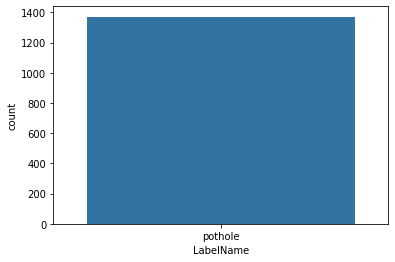

In [8]:
sns.countplot(x=train['LabelName']);

In [9]:
train['LabelName'].value_counts()

pothole    1371
Name: LabelName, dtype: int64

#### The above plot and summary explains that the all images categorized under the single class(pothole).

### Each images have one or more than one annotation.Let's calculate the number of annotation for each image. 

In [12]:
train['total_pothole']=train.groupby('ImageID')['ImageID'].transform('count')

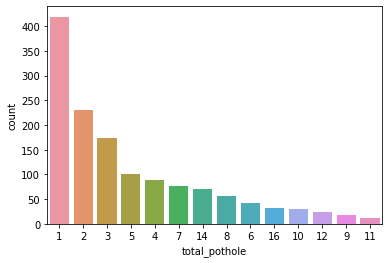

In [14]:
sns.countplot(x=train['total_pothole'], order=train['total_pothole'].value_counts().index);

In [15]:
train['total_pothole'].value_counts()

1     419
2     230
3     174
5     100
4      88
7      77
14     70
8      56
6      42
16     32
10     30
12     24
9      18
11     11
Name: total_pothole, dtype: int64

#### The above plot and summary explains that most of images have 1 to 5 annotation information.

### Let's extract basic information of the image like width, height, colormode.

In [8]:
def basic_image_info(path):
    ImageID=[]
    img_mode=[]
    img_height=[]
    img_width=[]
    for subdir, dirs, files in os.walk(path):
        for file in files:
            ImageID.append(file)
            img=Image.open(f"{(os.path.join(subdir, file))}")
            img_mode.append(img.mode)
            img_width.append(img.width)
            img_height.append(img.height)


    return pd.DataFrame({'ImageID':ImageID,'img_mode':img_mode,'img_width':img_width,'img_height':img_height})
    

In [9]:
train_image_basic_info=basic_image_info("/kaggle/input/build-an-ai-model-to-save-lives/train/train/images")

### Let's see is there any different color mode in the images.

In [10]:
train_image_basic_info['img_mode'].value_counts()

RGB    674
Name: img_mode, dtype: int64

#### The above information explain that the all images are in RGB color mode.

### Let's see the width distribution of image.

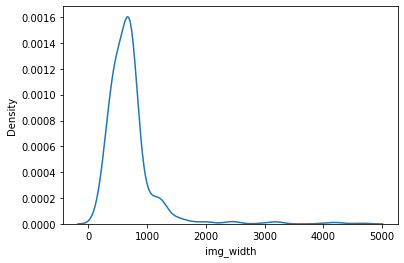

In [24]:
sns.kdeplot(x=train_image_basic_info['img_width']);

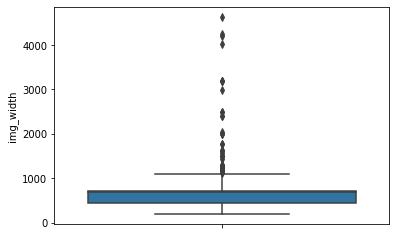

In [25]:
sns.boxplot(y=train_image_basic_info['img_width']);

In [27]:
train_image_basic_info['img_width'].describe()

count     674.000000
mean      702.449555
std       452.219859
min       194.000000
25%       453.000000
50%       698.000000
75%       720.000000
max      4640.000000
Name: img_width, dtype: float64

#### The above kernel density plot and information explains that the distribution of image width is right skewed.
#### The average image width is 702 pixels.
#### The image width ranges from 194 to 4640 pixels.
#### The boxplot explains that there are images with more than 1000 pixel width.

### Let's compare the number of annotations and the width of the image.

In [13]:
train_image_basic_info=pd.merge(train_image_basic_info,train[['ImageID','total_pothole']],on='ImageID',how='left')

### Let's create a function for side by side plot(density and group-wise boxplot).

In [14]:
def side_by_side_plot(df,grp,valcol,rot=None,size=(15,6)):
    clr="Paired"
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=size)
    fig.tight_layout()
    sns.kdeplot(x=df[valcol], hue=df[grp],ax=ax1,palette=clr)
    ax1.set_title(grp.capitalize()+" Wise "+valcol.capitalize()+" Distribution",size=15)
    ax1.set_xlabel(valcol,fontsize=20)
    sns.boxplot(x=df[grp],y=df[valcol],ax=ax2,palette=clr)
    ax2.set_title(grp.capitalize()+" Wise "+valcol.capitalize()+" Distribution",size=15)
    ax2.set_xlabel(grp,fontsize=20)
    ax2.set_ylabel("")
    ax2.tick_params(rotation=rot)

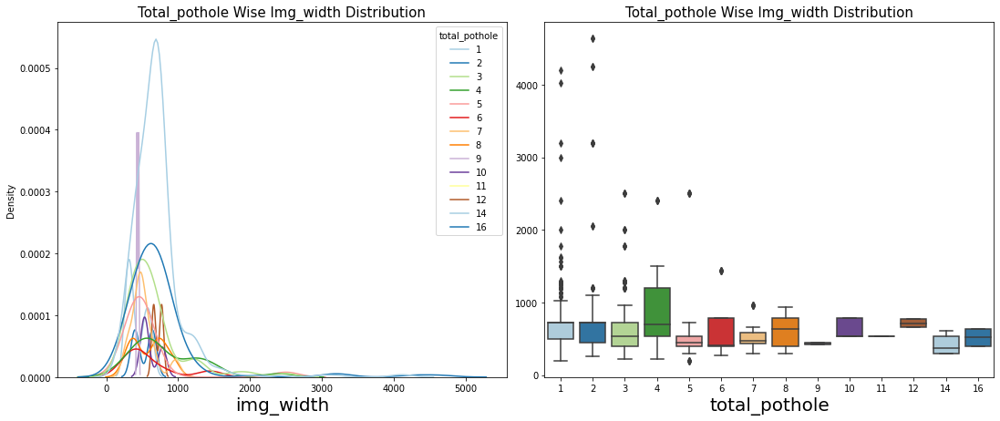

In [46]:
side_by_side_plot(train_image_basic_info,'total_pothole','img_width')

In [47]:
train_image_basic_info.groupby('total_pothole')['img_width'].describe()

,count,mean,std,min,25%,50%,75%,max
total_pothole,,,,,,,,
1,419.0,708.143198,396.741661,194.0,492.5,720.0,720.0,4200.0
2,230.0,751.608696,642.828475,259.0,452.0,720.0,720.0,4640.0
3,174.0,662.620690,424.610035,225.0,401.0,534.5,720.0,2500.0
4,88.0,854.681818,508.838062,225.0,533.0,695.0,1200.0,2400.0
5,100.0,558.850000,460.705462,200.0,400.0,450.0,533.0,2500.0
6,42.0,606.714286,376.371527,275.0,400.0,409.0,790.0,1440.0
7,77.0,512.727273,174.623327,300.0,438.0,467.0,590.0,960.0
8,56.0,595.000000,221.486548,290.0,396.0,639.0,780.0,930.0
9,18.0,438.500000,11.833402,427.0,427.0,438.5,450.0,450.0


#### The above plot and summary explain that the images that have 1 to 6 annoatations are the more than 800 pixels of height. 

### Let's see the height distribution of image.

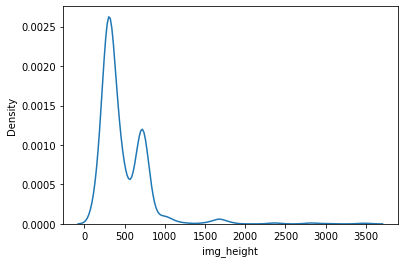

In [48]:
sns.kdeplot(x=train_image_basic_info['img_height']);

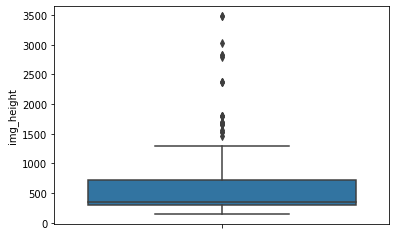

In [49]:
sns.boxplot(y=train_image_basic_info['img_height']);

In [51]:
train_image_basic_info['img_height'].describe()

count    1371.000000
mean      479.438366
std       323.386054
min       150.000000
25%       300.000000
50%       349.000000
75%       720.000000
max      3480.000000
Name: img_height, dtype: float64

#### The above kernel density plot and information explains that the distribution of image height is right skewed.
#### The average image height is 479 pixels.
#### The image height ranges from 150 to 3480 pixels.
#### The boxplot explains that there are images with more than 1000 pixel height.

### Let's compare the number of annotations and the width of the image.

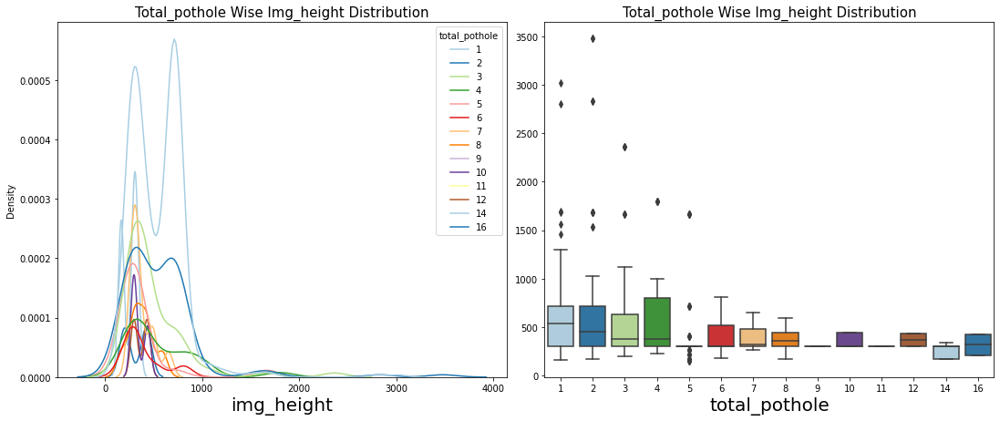

In [52]:
side_by_side_plot(train_image_basic_info,'total_pothole','img_height')

In [54]:
train_image_basic_info.groupby('total_pothole')['img_height'].describe()

,count,mean,std,min,25%,50%,75%,max
total_pothole,,,,,,,,
1,419.0,547.219570,293.563968,159.0,300.0,532.0,720.0,3024.0
2,230.0,574.347826,443.371936,168.0,300.0,450.0,720.0,3480.0
3,174.0,498.586207,355.152432,194.0,300.0,381.0,628.0,2365.0
4,88.0,568.818182,373.240132,230.0,300.0,378.5,800.0,1800.0
5,100.0,374.800000,317.057590,150.0,300.0,300.0,300.0,1666.0
6,42.0,387.571429,198.226668,183.0,300.0,300.0,520.0,810.0
7,77.0,374.090909,114.669225,262.0,300.0,318.0,480.0,654.0
8,56.0,370.428571,123.627425,174.0,300.0,360.0,439.0,590.0
9,18.0,300.000000,0.000000,300.0,300.0,300.0,300.0,300.0


#### The above plot and summary explain that the images that have 1 to 5 annoatations are the more than 800 pixels of height. 

### Let's see the RGB color mode distribution of the image by number of annotation(pothole).

In [15]:
def rgb_dist_plot(img,ax):
    start=0
    end=256
    for _,color in enumerate(['Red','Green','Blue']):
        #_=plt.figure(figsize=[10,5])
        sns.kdeplot(img.histogram()[start:end],label=color,color=color ,ax=ax);
        plt.legend();
        start+=256
        end+=256

In [16]:
def image_and_rgb_dist(path,df,group,imgidcol):
    for im in df.groupby([group])[imgidcol].head(1):
        fig, axs = plt.subplots(1, 2 ,figsize=(15,8))
        img = Image.open(f"{(os.path.join(path, im))}")
        axs[0].imshow(img)
        axs[0].axis('off')
        axs[0].set_title(im,fontsize=18)
        _=rgb_dist_plot(img,ax=axs[1])
        axs[1].set_title("RGB Color Distribution For "+im,fontsize=18)
        

In [ ]:
image_and_rgb_dist("/kaggle/input/build-an-ai-model-to-save-lives/train/train/images",train_image_basic_info,'total_pothole','ImageID')

#### Single image has taken from each number of pothole category and analyzed the image's RGB Color distribution.
#### The above RGB distribtuion explains that the blue is dominant color in all image.

### Let's calculate area of bounding box(annotated value). 

In [25]:
train['bbox_area']=train.apply(lambda df:((df['XMax']-df['XMin'])*(df['YMax']-df['YMin'])), axis=1)

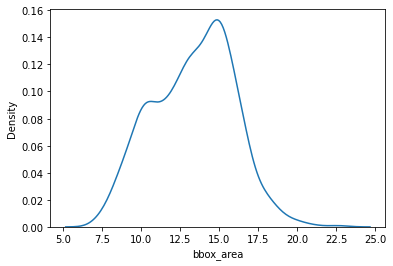

In [54]:
sns.kdeplot(np.log2(train['bbox_area']));

<AxesSubplot:ylabel='bbox_area'>

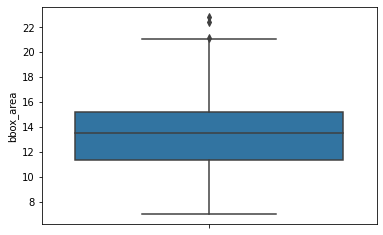

In [53]:
sns.boxplot(y=np.log2(train['bbox_area']))

#### For better visualization log transformation has applied.
#### The bounding box area distribution looks normal.
#### Let's create cluster for the bbox_area

In [33]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

### Create standard scaler and apply to the bbox_area column.

In [34]:
scl=StandardScaler()

### Let's create a kmeans cluster with the range of 2 to 8 number of cluster and select the best one.

In [ ]:
iner=[]
for k in range(2,8):
    km=KMeans(n_clusters=k).fit(scl.fit_transform(train[['bbox_area']]))
    iner.append(km.inertia_)
    

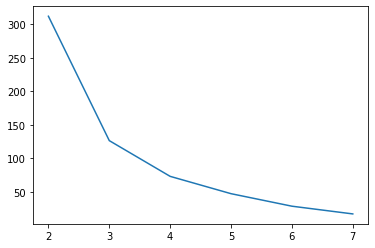

In [56]:
sns.lineplot(x=range(2,8),y=iner);

#### From the above elbow plot the n_cluster 3 is best one. Let's create a kmeans with 3 cluster.

In [42]:
km=KMeans(n_clusters=3).fit(scl.fit_transform(train[['bbox_area']]))

### Extract the cluster labels.

In [43]:
train['bbarclus']=km.labels_

### Let's visualize sample images from each cluster.

In [25]:
def img_read(path,im ,new_size=False):
    img = cv2.imread(f"{(os.path.join(path, im))}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if new_size:
        img=cv2.resize(img,(new_size,new_size))
        return img
    else:
        return img
        

In [26]:
def bbbox_annotate(img,bbox_df,new_size=False):
    if new_size:
        y_ = img.shape[0]
        x_ = img.shape[1]
        x_scale = new_size / x_
        y_scale = new_size / y_
        img=cv2.resize(img,(new_size,new_size))
        for index, row in bbox_df.iterrows():
            imgs=(cv2.rectangle(img,(int(np.round(row['XMin']*x_scale)),int(np.round(row['YMin']*y_scale))),
                                          (int(np.round(row["XMax"]*x_scale)),int(np.round(row["YMax"]*y_scale))),(0,255,0),5))
        return imgs
    else:
        for index, row in bbox_df.iterrows():
            imgs=(cv2.rectangle(img,(row['XMin'],row['YMin']),
                                          (row["XMax"],row["YMax"]),(0,255,0),5))
        return imgs
        
    

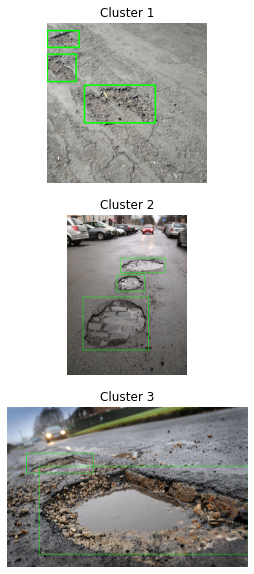

In [87]:
path='/kaggle/input/build-an-ai-model-to-save-lives/train/train/images'
fig, axs = plt.subplots(3, 1 ,figsize=(8, 10))
i=1
for im,ax in zip(train.groupby(['bbarclus'])['ImageID'].head(1),axs.flatten()):
    img=img_read(path,im)
    ax.imshow(bbbox_annotate(img,train[train['ImageID']==im].iloc[:,2:6]))
    ax.axis('off')
    ax.set_title(f"Cluster {i}")
    i+=1
    

#### The above images explain that the non-bounding box area region is gradually decreased in every cluster.
#### In cluster 3 the pothole images are ultra-zoomed or captured only the area.

### Let's see sample images by total pothole category.

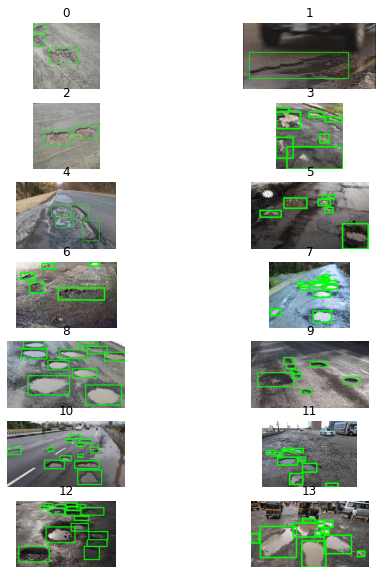

In [99]:
path='/kaggle/input/build-an-ai-model-to-save-lives/train/train/images'
fig, axs = plt.subplots(7, 2 ,figsize=(8, 10))
for i,(im,ax) in enumerate(zip(train.groupby(['total_pothole'])['ImageID'].head(1),axs.flatten())):
    img=img_read(path,im)
    ax.imshow(bbbox_annotate(img,train[train['ImageID']==im].iloc[:,2:6]))
    ax.axis('off')
    ax.set_title(f"{i}")
    
    

#### The images are in different pixels so let's resize all images in same pixels.

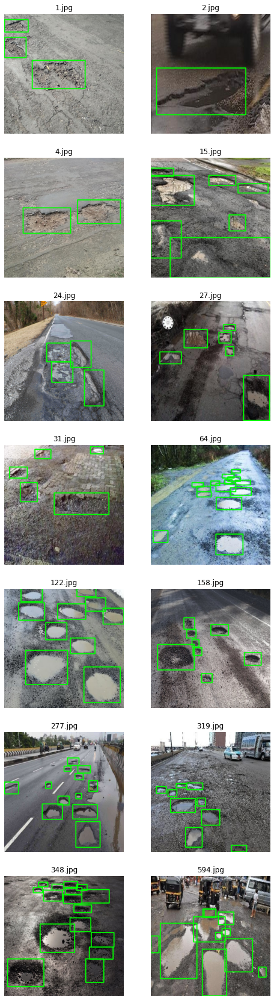

In [102]:
path='/kaggle/input/build-an-ai-model-to-save-lives/train/train/images'
fig, axs = plt.subplots(7, 2 ,figsize=(8, 30))
for i,(im,ax) in enumerate(zip(train.groupby(['total_pothole'])['ImageID'].head(1),axs.flatten())):
    img=img_read(path,im)
    ax.imshow(bbbox_annotate(img,train[train['ImageID']==im].iloc[:,2:6],new_size=800))
    ax.axis('off')
    ax.set_title(f"{im}")


#### The above images explains that there are images with over-lapping bounding box.

### Let's calculate hash value for the image by using various image hashing algorithm.

In [11]:
def get_image_hash(path):
    ImageID=[]
    img_avg_hash=[]
    img_phash=[]
    img_dhash=[]
    img_whash=[]
    img_color_hash=[]
    for subdir, dirs, files in os.walk(path):
        for file in files:
            ImageID.append(file)
            img=Image.open(f"{(os.path.join(subdir, file))}")
            img_avg_hash.append(imagehash.average_hash(img))
            img_phash.append(imagehash.phash(img))
            img_dhash.append(imagehash.dhash(img))
            img_whash.append(imagehash.whash(img))
            img_color_hash.append(imagehash.colorhash(img))
               

    return pd.DataFrame({'ImageID':ImageID,'img_avg_hash':img_avg_hash,'img_phash':img_phash,'img_dhash':img_dhash,
                             'img_whash':img_whash,'img_color_hash':img_color_hash})


In [12]:
train_hash_info=get_image_hash("/kaggle/input/build-an-ai-model-to-save-lives/train/train/images")

In [14]:
train_hash_info

,ImageID,img_avg_hash,img_phash,img_dhash,img_whash,img_color_hash
0,623.jpg,6f0f174741981e3f,a0b193d1e387ce0f,d89b67cf9b356ced,6f0f170741941e3f,06e00000000
1,208.jpg,ff7fe30100193c06,a8a197c83e43ecb5,fefcce1333b3e8ee,ff7fe30181193c06,07406000000
2,473.jpg,3fff9e4f03000000,8ca38cae2b291f3d,e78e7c9aaf75b6f0,3fffbfcf07030000,07000000000
3,333.jpg,ff9f0080803e3c00,9df88b877283836a,2032321c24e0f00b,ffdfd984803e3c00,07c00040000
4,537.jpg,fefffcec94800000,d5fa09971a55718c,98c88008245cb6f2,fefffcfcb4800000,07e02000000
...,...,...,...,...,...,...
669,364.jpg,7c00fffef2480800,d3d21201de99a9be,b8e828402cd2d0ec,7c00fffefe680c00,07e00000000
670,90.jpg,002d0f3e16070f0f,974a6b6d545a3516,c5c9fcecf6defdfe,022d0f3f1f0f0f0f,07e00000000
671,599.jpg,7cfcf7c31313c0b0,ec93cf290ee1866c,e120ac9e26a69324,7cfe57c31303c0f0,07640080000
672,25.jpg,ffffff0000c08800,fec0916b3690c07f,4024942d2f933b74,ffffff8500c18800,07e00000000


In [34]:
def image_simliarity(path,df,hash_type,hash_name):
    img_and_hash=[(i,j) for i,j in zip(list(df['ImageID']),list(df[hash_type].astype('str')))]
    duplicate1=[]
    duplicate2=[]
    for img1, img2 in itertools.combinations(img_and_hash,2):
        f1, hash1 = img1
        f2, hash2 = img2
        hashdif = distance.hamming(hash1, hash2)
        if hashdif < 5: 
        #print(f"images are similar due to dhash", "image1", f1, "image2", f2)
            duplicate1.append(f1)
            duplicate2.append(f2)
    print(f"Total Similar Images Based on {hash_name} Algorithm {len(duplicate1)}")
    
    for image1,image2 in zip(duplicate1[:10],duplicate2[:10]):
        fig, axs = plt.subplots(1, 2 ,figsize=(10, 8))
        img1=img_read(path,image1)
        axs[0].imshow(bbbox_annotate(img1,train[train['ImageID']==image1].iloc[:,2:6],new_size=800))
        axs[0].axis('off')
        axs[0].set_title(f"Smilar Image {image1}")
        img2=img_read(path,image2)
        axs[1].imshow(bbbox_annotate(img2,train[train['ImageID']==image2].iloc[:,2:6],new_size=800))
        axs[1].axis('off')
        axs[1].set_title(f"Smilar Image {image2}")
    
    

Total Similar Images Based on Average Hashing Algorithm 284
1.6056451797485352


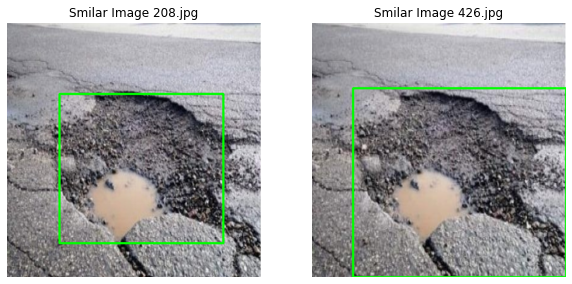

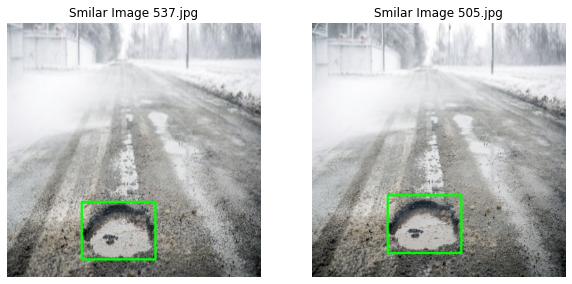

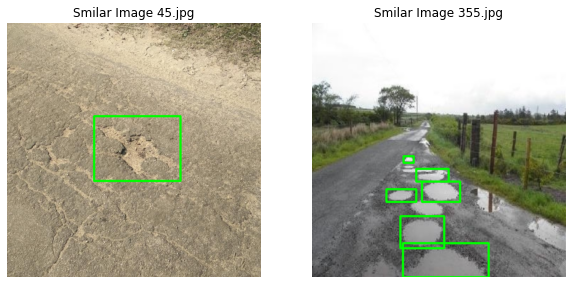

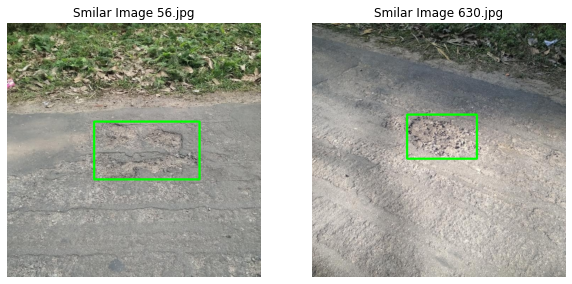

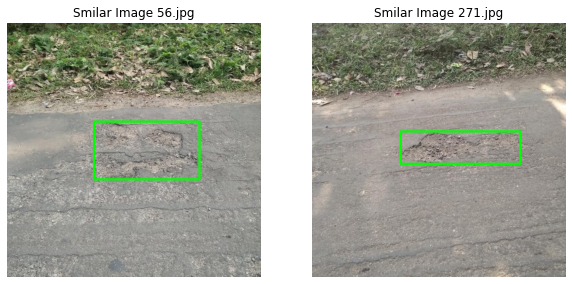

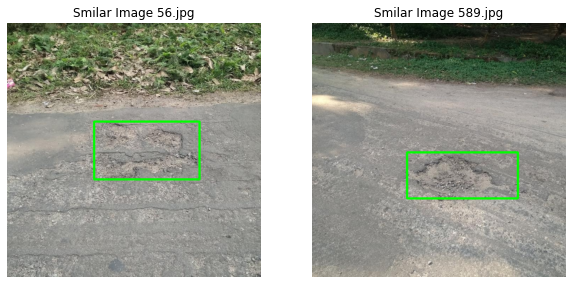

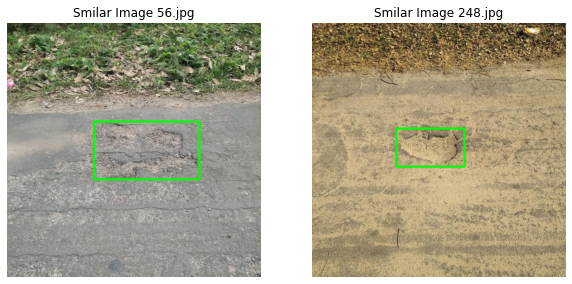

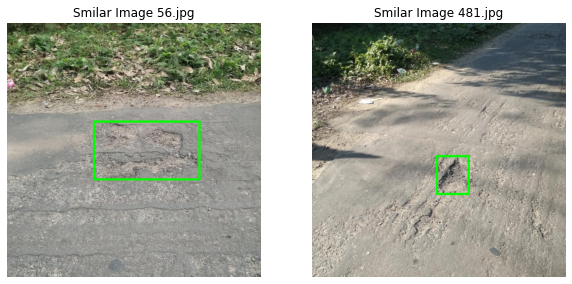

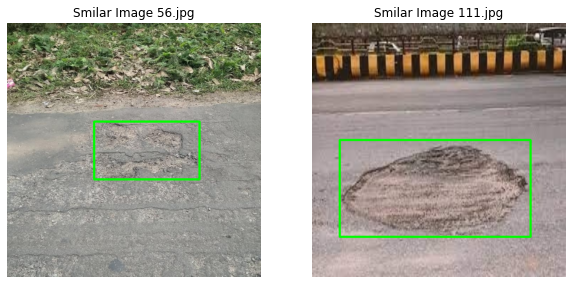

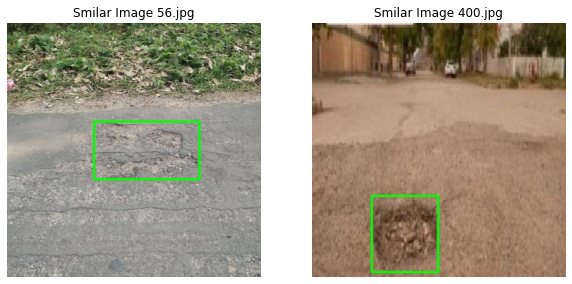

In [35]:
start = time.time()
image_simliarity("/kaggle/input/build-an-ai-model-to-save-lives/train/train/images",train_hash_info,hash_type='img_avg_hash',hash_name="Average Hashing")
end = time.time()
print(end - start)



Total Similar Images Based on Perceptual Hashing Algorithm 80
1.4875948429107666


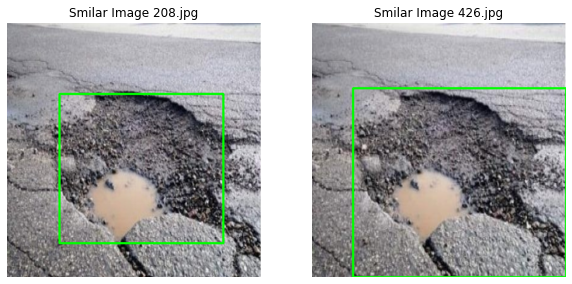

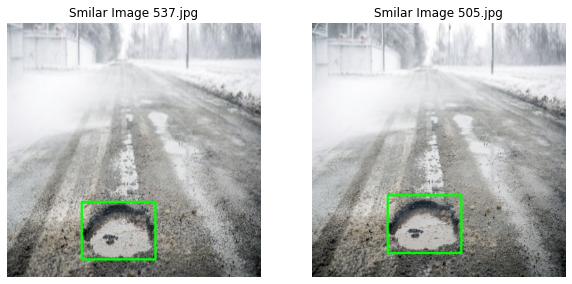

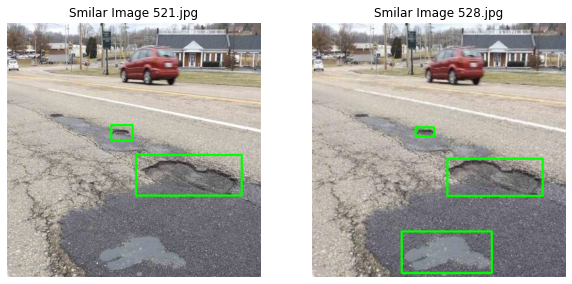

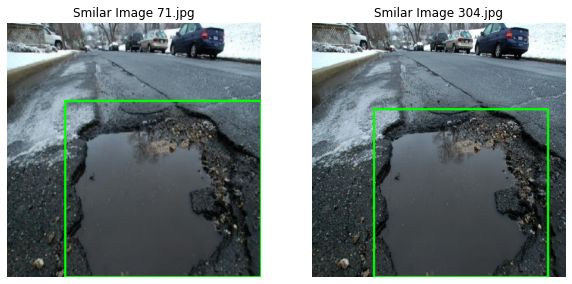

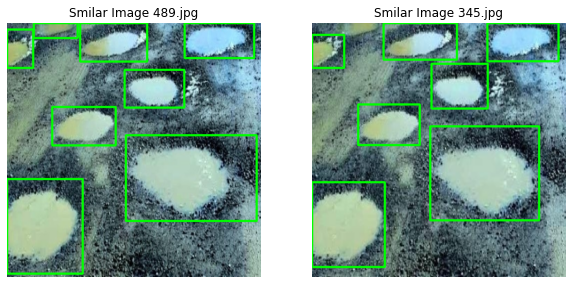

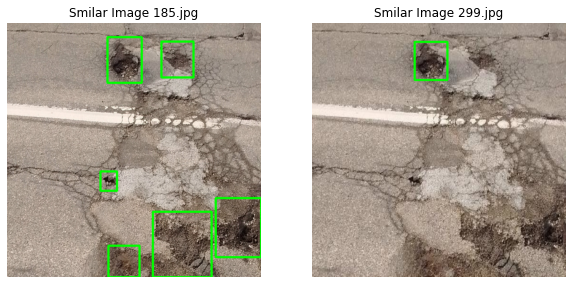

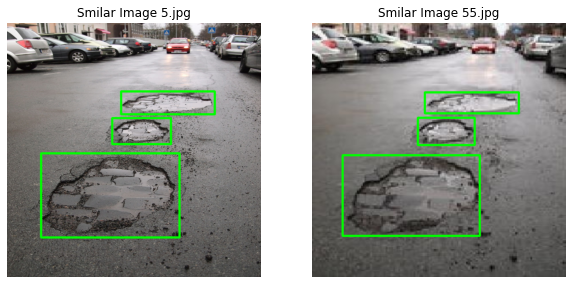

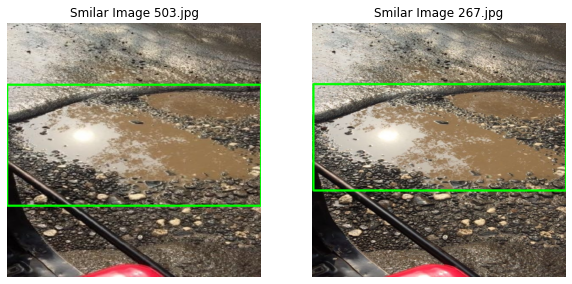

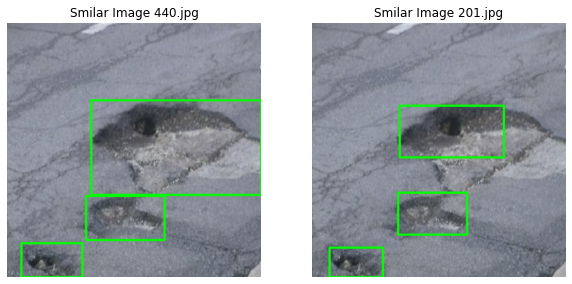

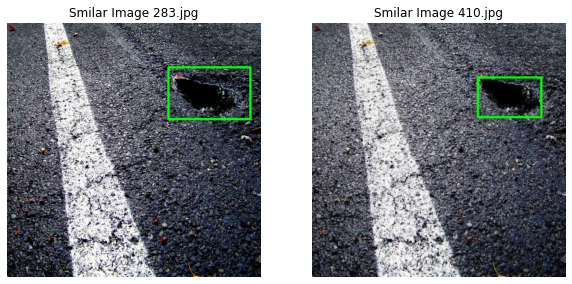

In [36]:
start = time.time()
image_simliarity("/kaggle/input/build-an-ai-model-to-save-lives/train/train/images",
                 train_hash_info,hash_type='img_phash',hash_name="Perceptual Hashing")
end = time.time()
print(end - start)



Total Similar Images Based on Difference Hash Algorithm 80
1.6402835845947266


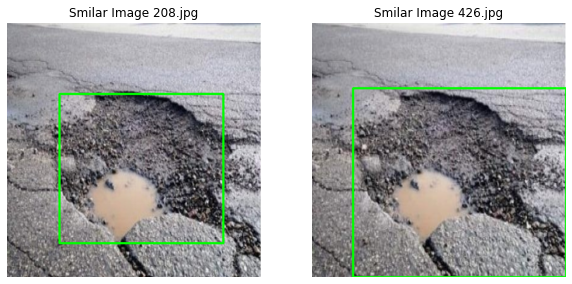

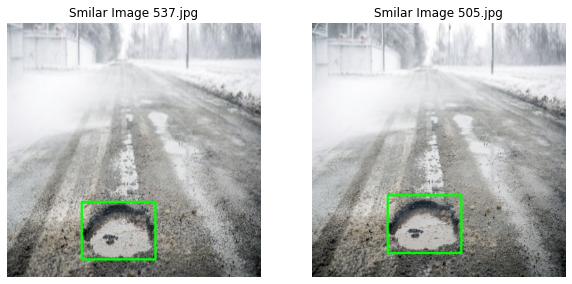

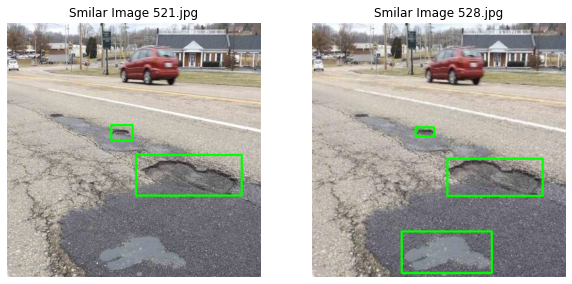

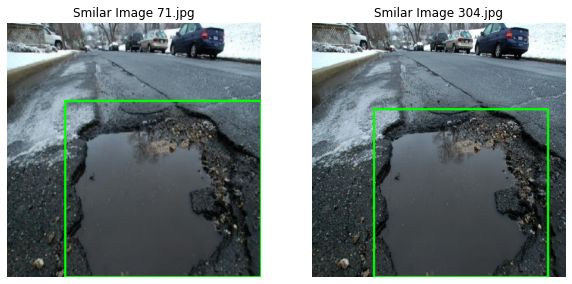

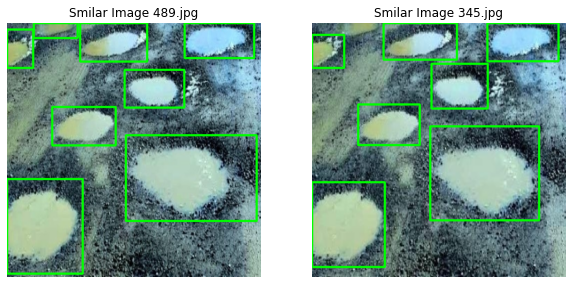

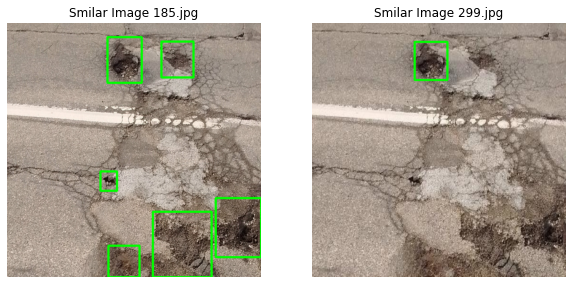

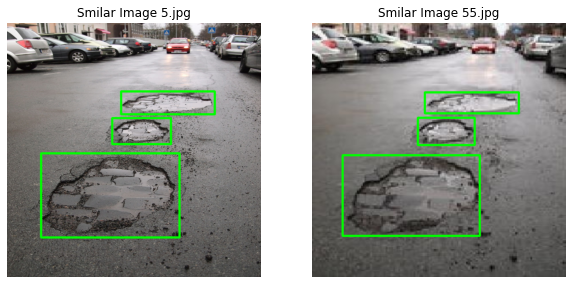

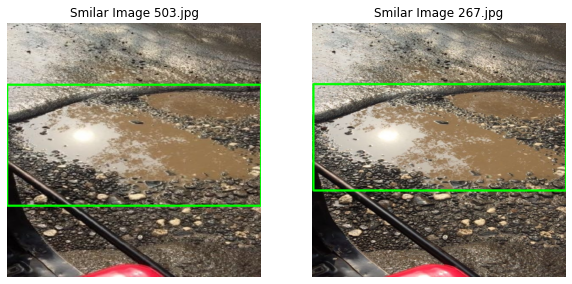

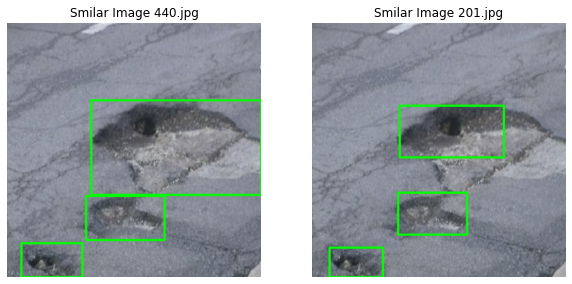

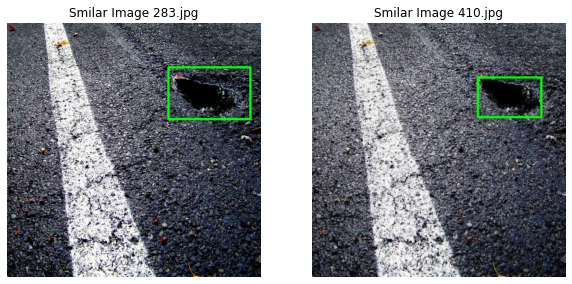

In [39]:
start = time.time()
image_simliarity("/kaggle/input/build-an-ai-model-to-save-lives/train/train/images",
                 train_hash_info,hash_type='img_phash',hash_name="Difference Hash")
end = time.time()
print(end - start)



Total Similar Images Based on Wavelet Hashing Algorithm 280
1.421483039855957


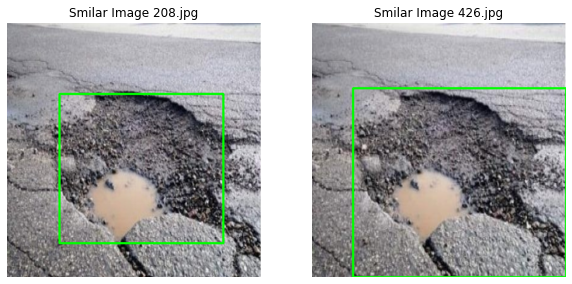

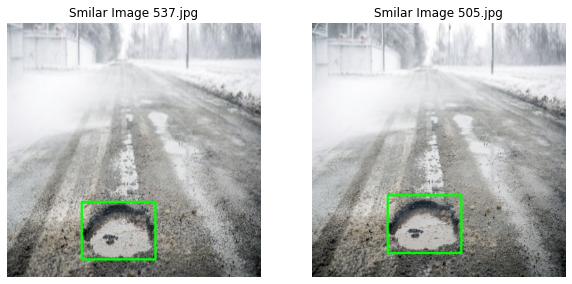

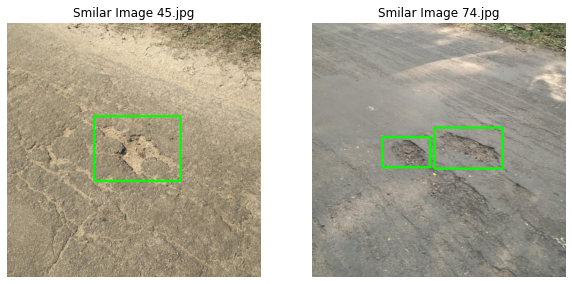

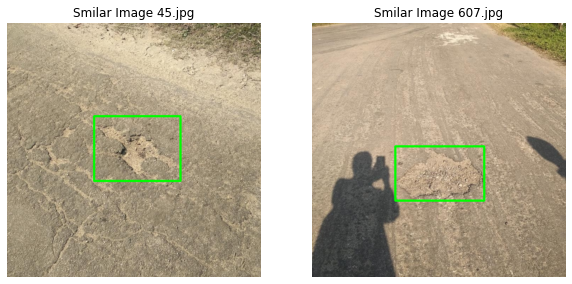

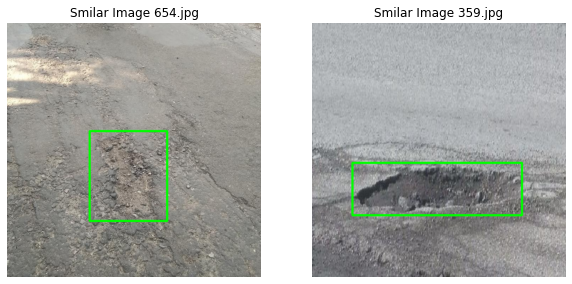

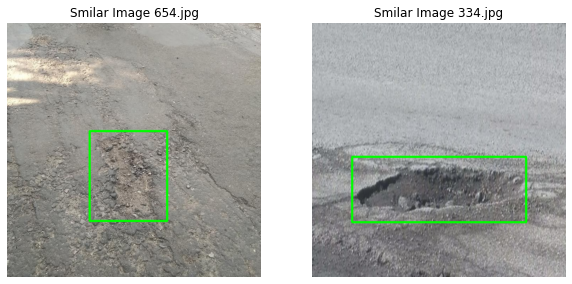

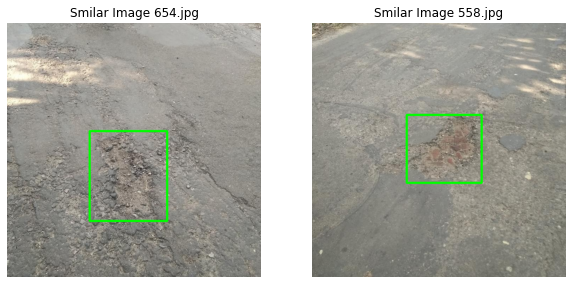

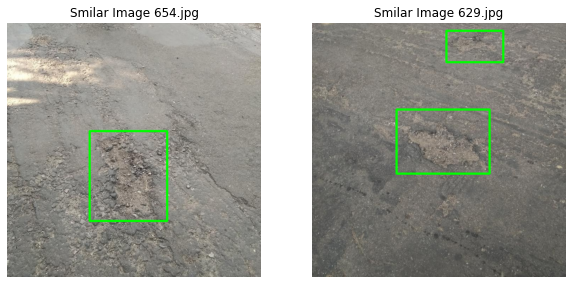

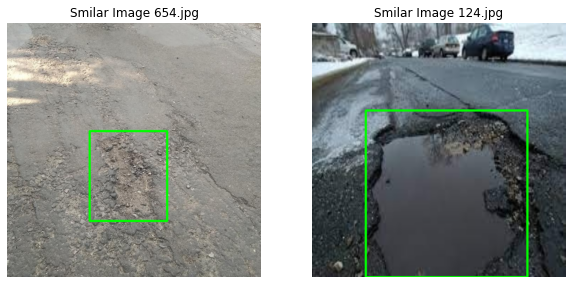

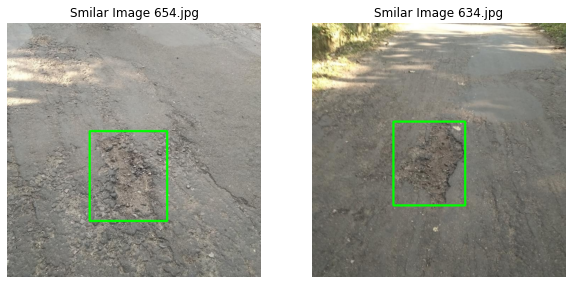

In [41]:
start = time.time()
image_simliarity("/kaggle/input/build-an-ai-model-to-save-lives/train/train/images",
                 train_hash_info,hash_type='img_whash',hash_name="Wavelet Hashing")
end = time.time()
print(end - start)

Total Similar Images Based on Color Hashing Algorithm 217120
1.3258650302886963


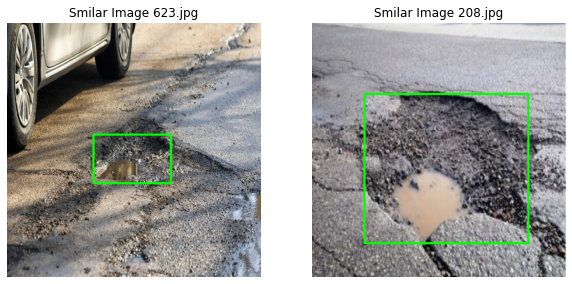

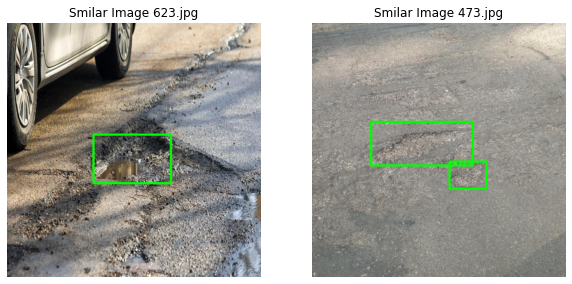

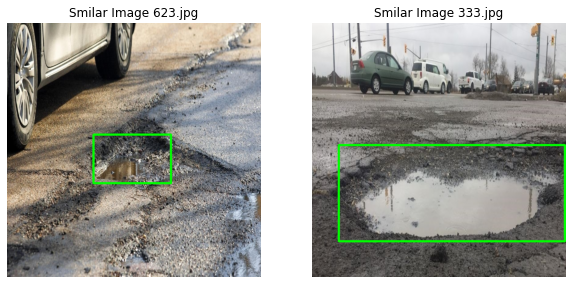

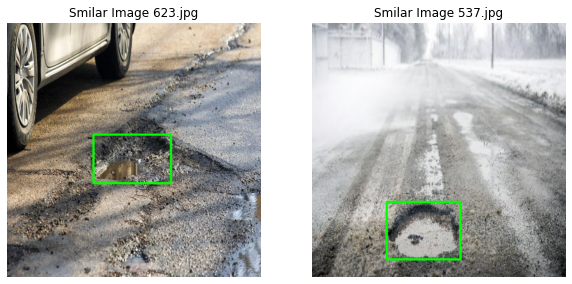

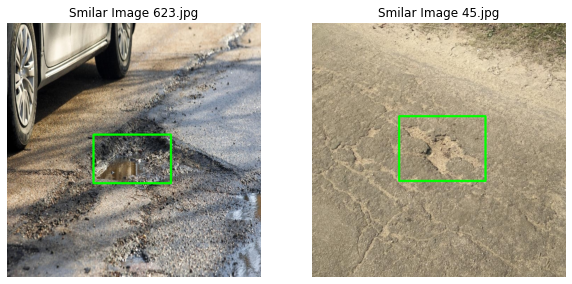

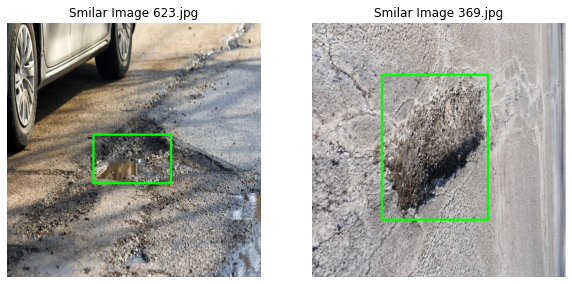

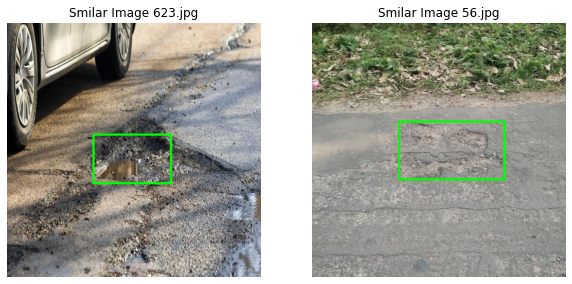

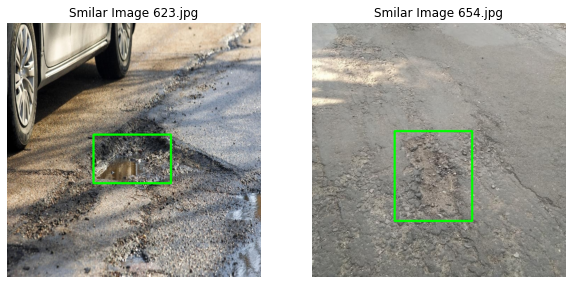

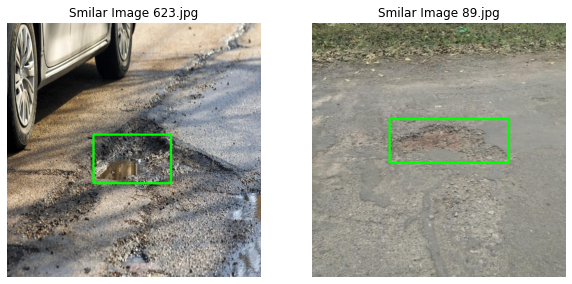

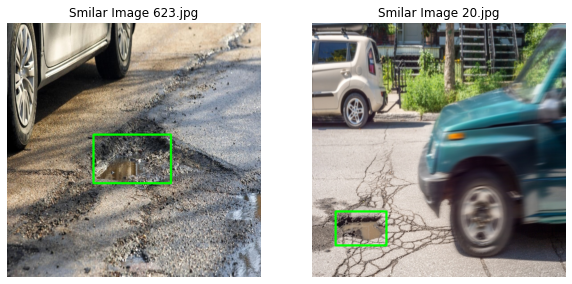

In [42]:
start = time.time()
image_simliarity("/kaggle/input/build-an-ai-model-to-save-lives/train/train/images",
                 train_hash_info,hash_type='img_color_hash',hash_name="Color Hashing")
end = time.time()
print(end - start)

In [40]:
train_hash_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 674 entries, 0 to 673
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   ImageID         674 non-null    object
 1   img_avg_hash    674 non-null    object
 2   img_phash       674 non-null    object
 3   img_dhash       674 non-null    object
 4   img_whash       674 non-null    object
 5   img_color_hash  674 non-null    object
dtypes: object(6)
memory usage: 31.7+ KB


In [ ]:
list(train['ImageID'],['img_avg_hash'])

In [ ]:
list((list(train['ImageID'].values),list(train['img_avg_hash'].values)))

In [ ]:
import distance

In [ ]:
387c7fc7c27e1040 - 91818181f3c3f1ff

In [ ]:
distance.hamming('387c7fc7c27e1040','91818181f3c3f1ff')

In [ ]:
for i,j in zip(list(train_hash_info['ImageID']),list(train_hash_info['img_avg_hash'])):
    print(i,j)

In [ ]:
avgh=[(i,j) for i,j in zip(list(train_hash_info['ImageID']),list(train_hash_info['img_avg_hash'].astype('str')))]

In [ ]:
clh=[(i,j) for i,j in zip(list(train_hash_info['ImageID']),list(train_hash_info['img_color_hash'].astype('str')))]b

In [ ]:
len(duplicates)

In [ ]:
duplicates = []
dup = []
for img1, img2 in itertools.combinations(clh,2):
    f1, dhash1 = img1
    f2, dhash2 = img2
    #Honestly not sure which hash method to use, so I went with dhash.
    hashdif = distance.hamming(dhash1, dhash2)


    if hashdif < 5:  #May change the 5 to find more accurate matches
            print("images are similar due to dhash", "image1", f1, "image2", f2)
            duplicates.append(f1)
            dup.append(f2)
    

In [ ]:
duplicates[:10]
dup

In [ ]:
print((os.path.join(rootdir, duplicates[0]) ))

In [ ]:
dd

In [ ]:

fig, axs = plt.subplots(1, 2)
for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        ImageID.append(file)
        img=Image.open(f"{(os.path.join(subdir, file))}")

In [ ]:
li=[]
for subdir, dirs, files in os.walk(rootdir):
    for file in files:
        li.append((file,1))

In [ ]:
train[train['ImageID']=='208.jpg']

In [ ]:
li